In [5]:
using LinearAlgebra, LaTeXStrings, Plots

# Methods of Computing the Global Optimum of Non-Convex Objectives

Isaac Hawn

ToDo

-Propose general problem and talk about solution difficulty and how there isn't a great way to solve these problems.
-Go over Piyavskii's procedure (lots of pictures)
-Go over Cone Search procedure (unity demonstration). Possible have run rust code on certain objectives so you can just show the graphs in the presentation.
-Go over proofs of convergence.
-Go over basin hopping procedure with lots of pictures
-Propose a practical problem like a (Krislock's problem in class with many local minima). Use Cone Search and Basin Hopping on it.

## Uniform Grid Search

In [2]:
function AB(f, α_val, β_val, x1, x2, L, k, a, b)
    fx2 = f(x2)
    if fx2 < β_val[2]
        β_val = (x2, fx2)
    end
    α_cand = (f(x1) + fx2)/2 - L *(b - a)/(2*k)
    if α_cand < α_val[2]
        αx = (x1 + x2)/2 + (f(x1) - fx2)/(2*L)
        α_val = (αx, α_cand)
    end
    return α_val, β_val
end

function ugs(f, L, a, b, start, maxit)
    ℓ = b - a
    α_vals = [(Inf, -Inf)]
    β_vals = [(Inf, Inf)]
    for k = start:maxit
        α = (0, Inf)
        β = (a, f(a))
        last = a
        for i = 1.0:k
            current = a + ℓ*i/k  
            α, β = AB(f, α, β, last, current, L, k, a, b)
            last = current
        end
        current = b
        α, β = AB(f, α, β, last, current, L, maxit, a, b)
        
        if α[2] > α_vals[length(α_vals)][2]
            push!(α_vals, α)
        else
            push!(α_vals, α_vals[length(α_vals)])
        end
        
        if β[2] < β_vals[length(β_vals)][2]
            push!(β_vals, β)
        else
            push!(β_vals, β_vals[length(β_vals)])
        end
    end
    popfirst!(α_vals)
    popfirst!(β_vals)

    return α_vals, β_vals
end

ugs (generic function with 1 method)

In [3]:
f(x) = x^2 + 5*sin(5x)
a, b = -2.0, 2.0
L = 28.774
start = 1
endd = 500

α_vals, β_vals = ugs(f, L, a, b, start, endd);

┌ Warning: scale log is unsupported with Plots.GRBackend().  Choose from: [:identity, :log10]
└ @ Plots C:\Users\Isaac\.julia\packages\Plots\Di0Qb\src\args.jl:1598


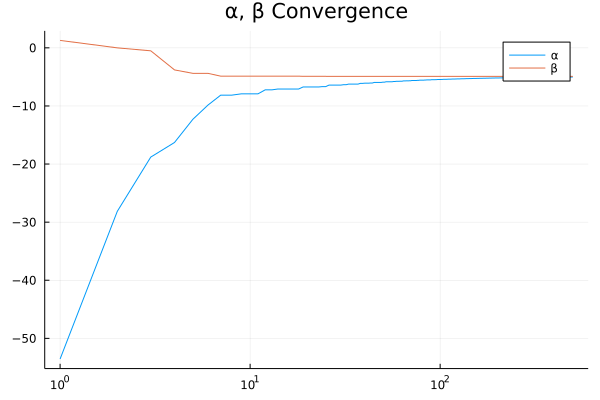

In [4]:
plot([α_vals[i][2] for i = 1:endd-start], label = "α", xscale=:log, title = "α, β Convergence")
plot!([β_vals[i][2] for i = 1:endd-start], label = "β")

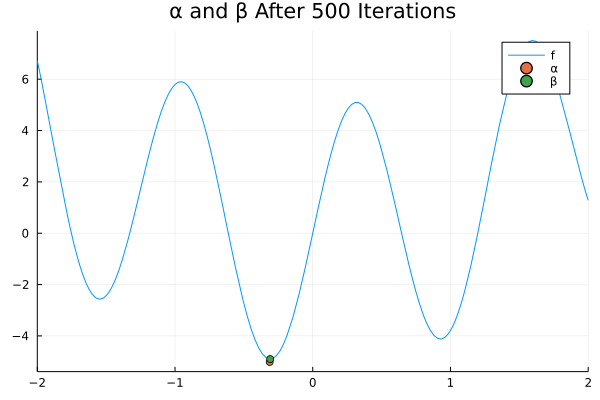

In [5]:
t = string("α and β After ", endd-start + 1, " Iterations")
plot(f, xlims = (a, b), label = "f", title = t)
scatter!([α_vals[length(α_vals)][1]], [α_vals[length(α_vals)][2]], label = "α")
scatter!([β_vals[length(β_vals)][1]], [β_vals[length(β_vals)][2]], label = "β")

┌ Info: Saved animation to 
│   fn = C:\Users\Isaac\Documents\Optimization\Defense\tmp.gif
└ @ Plots C:\Users\Isaac\.julia\packages\Plots\Di0Qb\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Isaac\\Documents\\Optimization\\Defense\\tmp.gif")
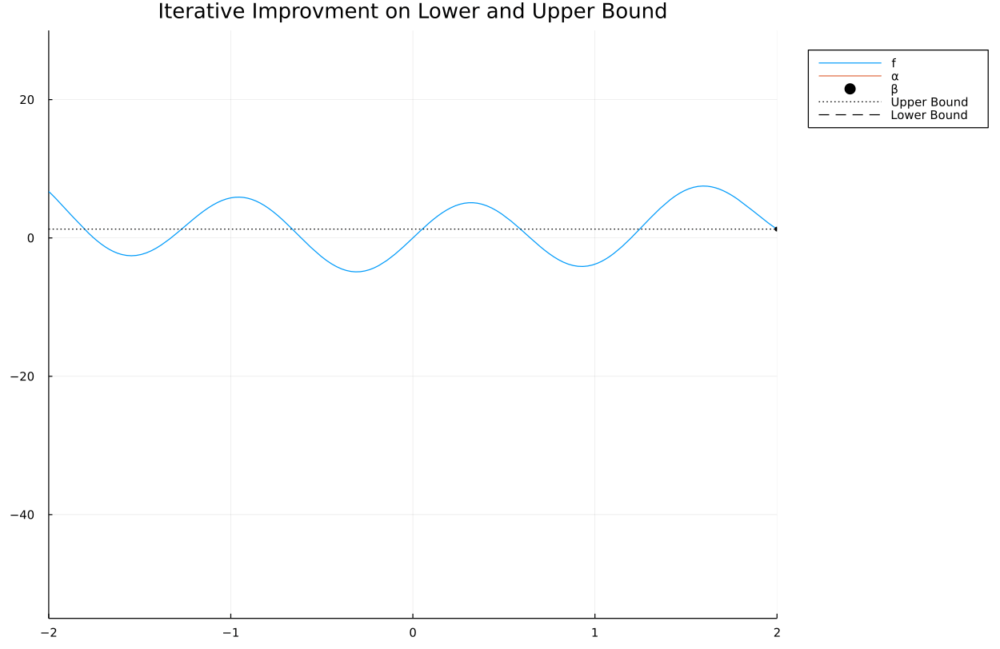

In [6]:
anim = @animate for i in 1:150
    α_vals, β_vals = ugs(f, L, a, b, 1, i);
    fα(x) = α_vals[i][2]
    fβ(x) = β_vals[i][2]
    plot(f, xlims = (a, b), ylims = (-55, 30), dpi = 125, label = "f", legend=:outertopright, size = (1000, 650))
    plot!([α_vals[i][1] for i = 1:length(α_vals)], [α_vals[i][2] for i = 1:length(α_vals)], label = "α", title = "Iterative Improvment on Lower and Upper Bound")
    scatter!([β_vals[i][1] for i = 1:length(β_vals)], [β_vals[i][2] for i = 1:length(β_vals)], label = "β", markersize = 3, color=:black)
    plot!(fβ, color=:black, style=:dot, label = "Upper Bound")
    plot!(fα, color=:black, style=:dash, label = "Lower Bound")
end
gif(anim, fps = 25)

## Piyavskii's Algorithm

In [7]:
SawTooth(x1, x2, z1, z2, L) = (z1 - z2)/2L + (x1 + x2)/2.0, (z1 + z2)/2 + L*(x1 - x2)/2

function Piyavskii(f, a, b, L, ϵ, m)
    fa = f(a); fb = f(b)
    x, y = SawTooth(a, b, fa, fb, L)

    x_list = [a, x, b]
    y_list = [fa, y, fb]
    X = [a, b]
    Y = [fa, fb]
    α_list = Float64[]
    β_list = Float64[]
    minpos = 0

    for i = 1:m
        minpos = argmin(y_list)
        y_list[minpos] = f(x_list[minpos])

        for j = 1:2
            pos1 = minpos - j%2
            pos2 = minpos + (j+1)%2
            x, y = SawTooth(x_list[pos1], x_list[pos2], y_list[pos1], y_list[pos2], L)
            append!(x_list, x); append!(y_list, y);
            append!(X, x)
            append!(Y, f(x))
        end

        p = sortperm(x_list); permute!(x_list, p); permute!(y_list, p)

        α = minimum(y_list)
        β, minpos = findmin(Y)
        append!(α_list, α); append!(β_list, β)

        if β - α <= ϵ
            break
        end
    end

    x = X[minpos]
    y = Y[minpos]

    return x, y, x_list, y_list, α_list, β_list
end

Piyavskii (generic function with 1 method)

In [8]:
function AnimPya(k, ps, ylim)
    anim = @animate for i in 1:k
        x, y, x_list, y_list, α_list, β_list = Piyavskii(f, a, b, L, ϵ, i)
        
        l = @layout [a b]
        p1 = plot(f, xlims = (a, b), ylims = ylim, dpi = 175, label = "f", legend = :outerbottom, size = (1000, 450), title = "Piyavskii's Algorithm")
        plot!(x_list, y_list, style=:dash, label = "Sawtooth Approximation")
        scatter!([x], [y], label = "Solution")
        
        p2 = plot([β_list[p] for p = 1:min(i, length(β_list))], label = "β", title = "α, β Convergence", color=:red, dpi = 150, legend=:outerbottom)
        plot!([α_list[p] for p = 1:min(i, length(α_list))], label = "α", color=:purple)
        
        plot(p1, p2, layout = l)
    end
    gif(anim, fps = ps)
end

AnimPya (generic function with 1 method)

┌ Info: Saved animation to 
│   fn = C:\Users\Isaac\Documents\Optimization\Defense\tmp.gif
└ @ Plots C:\Users\Isaac\.julia\packages\Plots\Di0Qb\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Isaac\\Documents\\Optimization\\Defense\\tmp.gif")
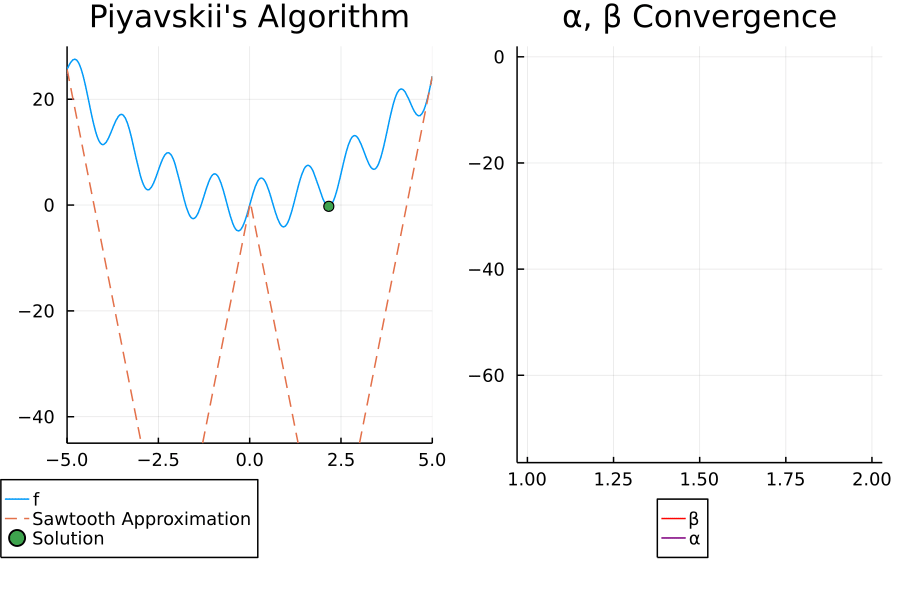

In [9]:
f(x) = x^2 + 5*sin(5x)
L = 34.79
a, b = -5.0, 5.0
ϵ = 1e-8
AnimPya(100, 20, (-45, 30))

┌ Info: Saved animation to 
│   fn = C:\Users\Isaac\Documents\Optimization\Defense\tmp.gif
└ @ Plots C:\Users\Isaac\.julia\packages\Plots\Di0Qb\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Isaac\\Documents\\Optimization\\Defense\\tmp.gif")
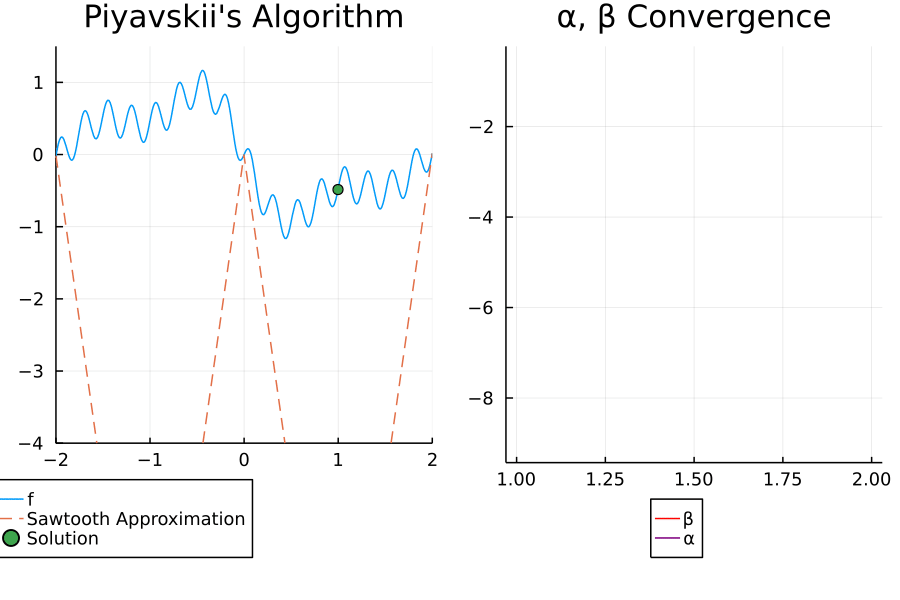

In [10]:
f(x) = -(x + sin(x))*exp(-x^2) + (sin(10*x))*(cos(15x)/2)
L = 9.165
a, b = -2.0, 2.0
ϵ = 1e-8
AnimPya(100, 20, (-4, 1.5))

┌ Info: Saved animation to 
│   fn = C:\Users\Isaac\Documents\Optimization\Defense\tmp.gif
└ @ Plots C:\Users\Isaac\.julia\packages\Plots\Di0Qb\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Isaac\\Documents\\Optimization\\Defense\\tmp.gif")
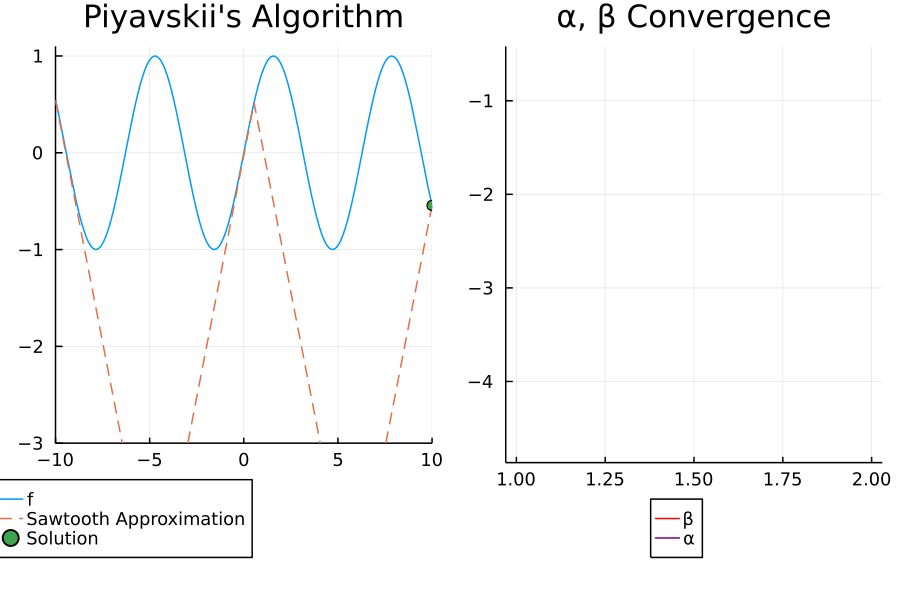

In [11]:
f(x) = sin(x)
L = 1.0
a, b = -10.0, 10.0
ϵ = 1e-8
AnimPya(200, 50, (-3, 1.1))

┌ Info: Saved animation to 
│   fn = C:\Users\Isaac\Documents\Optimization\Defense\tmp.gif
└ @ Plots C:\Users\Isaac\.julia\packages\Plots\Di0Qb\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Isaac\\Documents\\Optimization\\Defense\\tmp.gif")
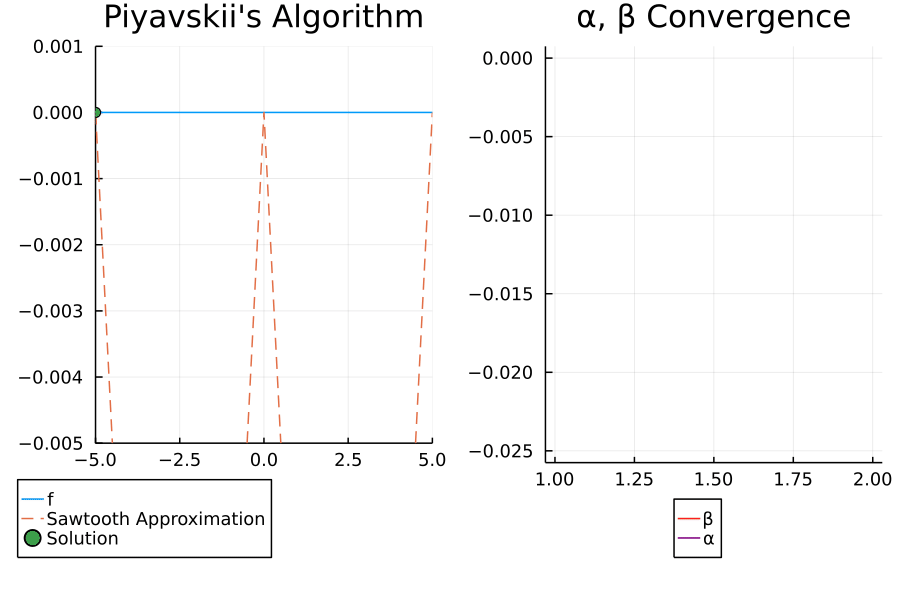

In [12]:
f(x) = 0
L = 0.01
a, b = -5.0, 5.0
ϵ = 1e-8
AnimPya(260, 30, (-0.005, 0.001))

## Applications

These methods can be used to effectively solve Levenberg-Marquardt problems. As a simple example, consider the following model.

$$
f(x) = a\sin(bx) + b\cos(ax)
$$

For $a,b\in\mathbb{R}$

Define a parameter vector $p$ and a nonlinear fitting function $y(p)$ like so:

$$
p = \begin{bmatrix} a \\ b \end{bmatrix}, \;\; y(p) = \begin{bmatrix} f(x_1) \\ \vdots \\ f(x_n) \end{bmatrix}
$$

Where $(x_1, f(x_1)), \ldots, (f(x_n), x_n)$ are noisy population datapoints. Notice that we are fixing $L$ so that the result may be plotable.

We may estimate the parameters $a$ and $b$ by minimizing $Loss(p) = \|f(x) - y(p)\|_2^2$.

In [34]:
#Actual parameters
a = 10(2*rand() - 1)
b = 10(2*rand() - 1)

f(x) = a*sin(b*x) + b*cos(a*x)

#Generate noisy data
datasize = 600
variation = 4
x_range = range(-10, 10, length=datasize)
y_range = f.(x_range) + randn(datasize)*variation;

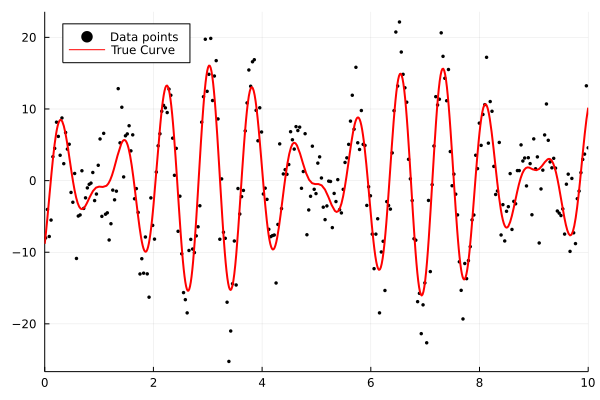

In [35]:
scatter(x_range, y_range, label = "Data points", color=:black, markersize = 2)
plot!(f, legend=:topleft, label = "True Curve", color=:red, xrange = (0, 10), linewidth = 2)

In [36]:
f_params(_a, _b) = [_a*sin(_b*x) + _b*cos(_a*x) for x in x_range]
f_params(p) = f_params(p...)
Loss(p) = norm(y_range - f_params(p))^2
Loss_plotter(_a, _b) = Loss([_a, _b]);

In [37]:
p = [a, b] + randn(2)*variation
Loss(p)

66564.78183488727

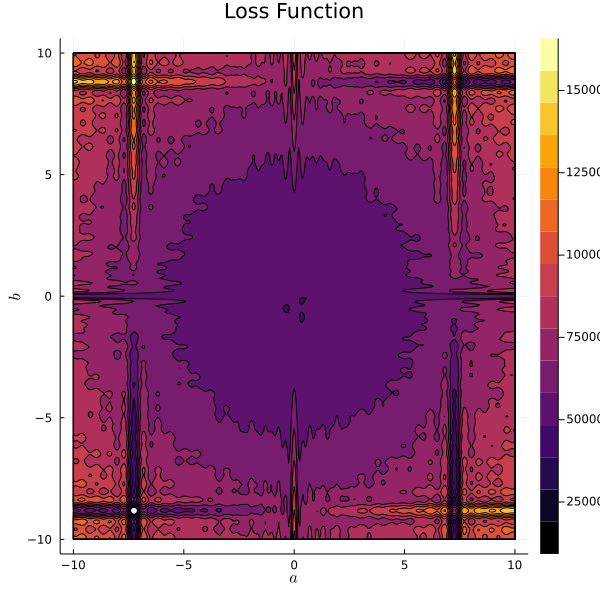

In [39]:
aa = -10:.05:10
bb = -10:.05:10

contour(aa, bb, Loss_plotter, fill=true, title = "Loss Function")
plot!(xlabel=L"a", ylabel=L"b", size=(600,600), legend=:none)
scatter!([a], [b], color=:white, label = "Known Solution")

In [16]:
include("basin_hopping.jl")

Basin_Hopping (generic function with 1 method)

In [40]:
global now = time()
xPlot = []
yPlot = []
solPlotX = []
solPlotY = []
searchX = []
searchY = []
minsX = []
minsY = []
finalSolX = []
finalSolY = []
distNoiseX = []
distNoiseY = []
timings = []
normDif = []

n = 2
minX = -10.0
maxX = 10.0
rand_num_points = 5
x0 = [-10, -10]
ϵ = 1e-8
η = 1e-2
α = 0.5
β = 0.8
κ = 1
ℓ = 0.4
ℓ_range = (0.2, abs(maxX - minX))
γ = 0.9
ϕ = 0.0
T = 1
static_threshold = 30 #number of iterations that we allow the solution to stay the same. Used as a stopping condition
target_acc_rate = 0.6
maxIterations = 5e2

runtime = @elapsed minSol = Basin_Hopping(Loss, x0, rand_num_points, minX, maxX, α, 
    β, η, ϵ, κ, ℓ, ℓ_range, γ, ϕ, T, target_acc_rate, maxIterations, static_threshold)

[-10, -10]
Computing first solution
Starting Basin Hopping

Iteration 1.0
Step Acceptance Rate = 100.0%
Step size = 0.4444444444444445
x = [-7.261295496398827, -8.81571687898304]
Objective = 8997.545521497217
n = 2

Iteration 2.0
Step Acceptance Rate = 100.0%
Step size = 0.4938271604938272
x = [-7.261295495981254, -8.815716880896591]
Objective = 8997.545521497217
n = 2

Iteration 3.0
Step Acceptance Rate = 100.0%
Step size = 0.5486968449931413
x = [-7.261295497077877, -8.815716879252427]
Objective = 8997.545521497217
n = 2

Iteration 4.0
Step Acceptance Rate = 100.0%
Step size = 0.6096631611034903
x = [-7.261295496692145, -8.815716879641979]
Objective = 8997.545521497223
n = 2

Iteration 5.0
Step Acceptance Rate = 100.0%
Step size = 0.6774035123372114
x = [-7.261295496593715, -8.815716880481716]
Objective = 8997.545521497217
n = 2

Iteration 6.0
Step Acceptance Rate = 100.0%
Step size = 0.7526705692635682
x = [-7.261295494747915, -8.815716878348939]
Objective = 8997.54552149722
n = 2



2.5898269

In [41]:
fit_params = minSol[1]
best_fit = f_params(fit_params)
[fit_params [a, b]]

2×2 Matrix{Float64}:
 -7.2613   -7.25724
 -8.81572  -8.82151

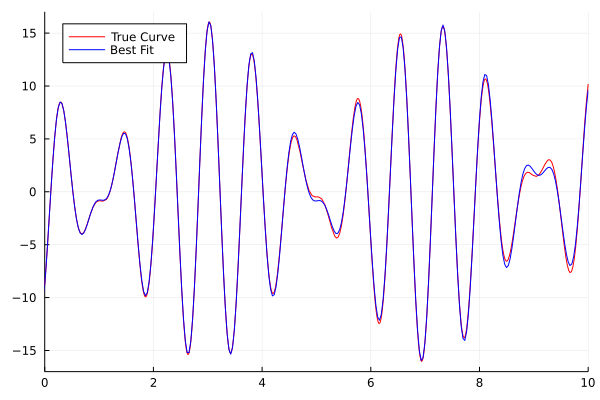

In [42]:
plot(f, legend=:topleft, label = "True Curve", color=:red, xrange = (0, 10))
plot!(x_range, best_fit, color="blue", label = "Best Fit")

We will now try a slightly more difficult example. Suppose we wish to model some population data with the logistics equation. 

$$
f(x) = \frac{L}{1 + \exp(-k(x - x_0))}
$$

Notice this problem is only slightly more difficult since we introduce a third parameter.

In [120]:
#Actual parameters
L = 100
k = 1
x_0 = 5

f(x) = L/(1 + exp(-k*(x - x_0)))

#Generate noisy data
datasize = 200
variation = 20
xmax = 10
x_range = range(0, xmax, length=datasize)
y_range = [max(f(x_range[i]) + randn()*variation*(Float64(i)/length(x_range)), randn()) for i = 1:length(x_range)];

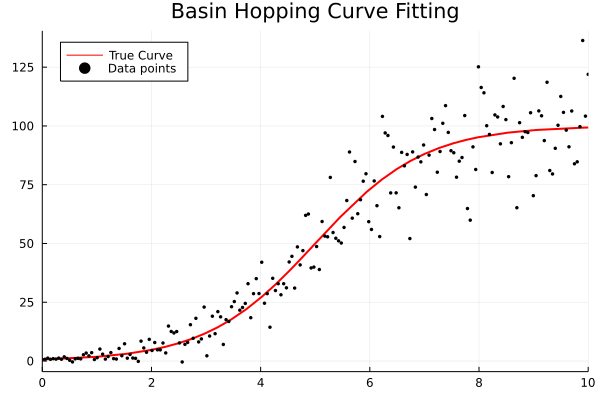

In [121]:
plot(f, legend=:topright, label = "True Curve", color=:red, xrange = (0, 10), linewidth = 2)
scatter!(x_range, y_range, label = "Data points", legend=:topleft, color=:black, markersize = 2, title = "Basin Hopping Curve Fitting")

In [122]:
f_params(_L, _k, _x0) = [_L/(1 + exp(-_k*(x - _x0))) for x in x_range]
Loss(p) = norm(y_range - f_params(p))^2;

In [125]:
include("basin_hopping.jl")
global now = time()
xPlot = []
yPlot = []
solPlotX = []
solPlotY = []
searchX = []
searchY = []
minsX = []
minsY = []
finalSolX = []
finalSolY = []
distNoiseX = []
distNoiseY = []
timings = []
normDif = []

n = 3
minX = -200
maxX = 200
rand_num_points = 5
x0 = [50.0, 10.0, 10.0]
ϵ = 1e-8
η = 1e-2
α = 0.5
β = 0.8
κ = 1
ℓ = 0.4
ℓ_range = (0.2, abs(maxX - minX))
γ = 0.9
ϕ = 0.0
T = 1
static_threshold = 15 #number of iterations that we allow the solution to stay the same. Used as a stopping condition
target_acc_rate = 0.6
maxIterations = 5e2

runtime = @elapsed minSol = Basin_Hopping(Loss, x0, rand_num_points, minX, maxX, α, 
    β, η, ϵ, κ, ℓ, ℓ_range, γ, ϕ, T, target_acc_rate, maxIterations, static_threshold)

[50.0, 10.0, 10.0]
Computing first solution
Starting Basin Hopping

Iteration 1.0
Step Acceptance Rate = 100.0%
Step size = 0.4444444444444445
x = [96.37220251893096, 1.010731390192657, 4.877693036621509]
Objective = 22676.125768799906
n = 3

Iteration 2.0
Step Acceptance Rate = 50.0%
Step size = 0.4
x = [96.37220251893096, 1.010731390192657, 4.877693036621509]
Objective = 22240.201630243442
n = 3

Iteration 3.0
Step Acceptance Rate = 33.33333333333333%
Step size = 0.36000000000000004
x = [96.37220251893096, 1.010731390192657, 4.877693036621509]
Objective = 22240.201630243442
n = 3

Iteration 4.0
Step Acceptance Rate = 25.0%
Step size = 0.32400000000000007
x = [96.37220251893096, 1.010731390192657, 4.877693036621509]
Objective = 22240.201630243442
n = 3

Iteration 5.0
Step Acceptance Rate = 20.0%
Step size = 0.2916000000000001
x = [96.37220251893096, 1.010731390192657, 4.877693036621509]
Objective = 22240.201630243442
n = 3

Iteration 6.0
Step Acceptance Rate = 16.666666666666664%
Step

Step Acceptance Rate = 66.66666666666666%
Step size = 0.46461146250837543
x = [100.32986950064107, 0.9286075654363256, 5.0000035235098705]
Objective = 22210.43062514634
n = 3

Iteration 49.0
Step Acceptance Rate = 67.3469387755102%
Step size = 0.5162349583426393
x = [100.19167548416826, 0.9314439068692645, 4.995609702169808]
Objective = 22210.62342727987
n = 3

Iteration 50.0
Step Acceptance Rate = 66.0%
Step size = 0.5735943981584881
x = [100.19167548416826, 0.9314439068692645, 4.995609702169808]
Objective = 22210.469026502724
n = 3

Iteration 51.0
Step Acceptance Rate = 64.70588235294117%
Step size = 0.6373271090649868
x = [100.19167548416826, 0.9314439068692645, 4.995609702169808]
Objective = 22210.469026502724
n = 3

Iteration 52.0
Step Acceptance Rate = 63.46153846153846%
Step size = 0.7081412322944297
x = [100.19167548416826, 0.9314439068692645, 4.995609702169808]
Objective = 22210.469026502724
n = 3

Iteration 53.0
Step Acceptance Rate = 62.264150943396224%
Step size = 0.7868235

4.9977685

In [126]:
[minSol[1] [L, k, x_0]]

3×2 Matrix{Float64}:
 100.286     100.0
   0.929416    1.0
   4.9986      5.0

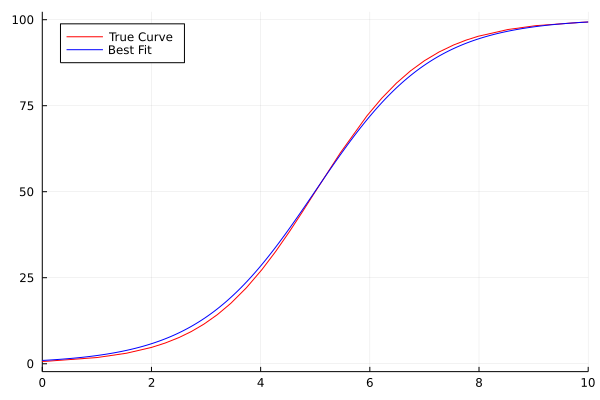

In [127]:
fit_params = minSol[1]
best_fit = f_params(fit_params...);
plot(f, legend=:topleft, label = "True Curve", color=:red, xrange = (0, 10))
plot!(x_range, best_fit, color="blue", label = "Best Fit")

### Solution using JuMP

We will now attempt to solve a problem of much higher dimension with the JuMP using the Ipopt optimizer which uses Basin Hopping. However the implementation is much more sophisticated than my own and will be able to solve much more complex problems

In [114]:
using JuMP, Ipopt

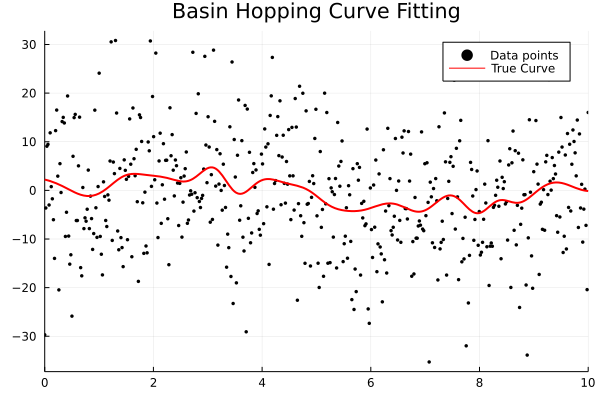

In [248]:
#Actual parameters
k = 2
a_params = 5*(2*rand(k) .- 1)
b_params = 5*(2*rand(k) .- 1)
params = vcat(a_params, b_params)

f(x) = sum(b_params[i]*sin(x*a_params[i] + a_params[i]*cos(x*b_params[i])) for i = 1:k)

#Generate noisy data
datasize = 500
variation = 10
x_range = range(0, 10, length=datasize)
y_range = f.(x_range) + randn(datasize)*variation

f_params(_params) = 
[sum(_params[Int(i + length(_params)/2)]*sin(x*_params[i] + _params[i]*cos(x*_params[Int(i + length(_params)/2)]))
        for i = 1:k) for x in x_range]

function Loss(a1, a2, b1, b2) #I get errors if I try a vector broadcast for the params
    vec = y_range - f_params([a1, a2, b1, b2])
    dot(vec, vec)
end

scatter(x_range, y_range, label = "Data points", color=:black, markersize = 2, title = "Basin Hopping Curve Fitting")
plot!(f, legend=:topright, label = "True Curve", color=:red, xrange = (0, 10), linewidth = 2)

In [249]:
model = JuMP.Model(Ipopt.Optimizer)

@variable(model, -5 <= a[1:k] <= 5)
@variable(model, -5 <= b[1:k] <= 5)


@NLobjective(model, Min, Loss(a[1], a[2], b[1], b[2])) #I get errors if I try a vector broadcast for the params

┌ Warning: Function Loss automatically registered with 4 arguments.
│ 
│ Calling the function with a different number of arguments will result in an
│ error.
│ 
│ While you can safely ignore this warning, we recommend that you manually
│ register the function as follows:
│ ```Julia
│ model = Model()
│ register(model, :Loss, 4, Loss; autodiff = true)
│ ```
└ @ JuMP C:\Users\Isaac\.julia\packages\JuMP\R2Knd\src\parse_nlp.jl:21


In [250]:
optimize!(model)

This is Ipopt version 3.14.4, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        0

Total number of variables............................:        4
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        4
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.4763034e+04 0.00e+00 0.00e+00   0.0 0.00e+00    -  0.00e+00 0.00e+00  

In [251]:
[value.(a) a_params]

2×2 Matrix{Float64}:
 0.0  -3.04969
 0.0   0.656827

In [252]:
[value.(b) b_params]

2×2 Matrix{Float64}:
 0.0  -1.35394
 0.0   3.41911